In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# For plotting out map -- comment the rest of the cell out if not needed
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from cartopy.io.img_tiles import GoogleTiles
import matplotlib.patheffects as PathEffects
import matplotlib.patches as patches
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [2]:
# List out stations and create a dictionary of each dataframe
data_dir = "G:/My Drive/ATM233 Final/Data/CIMIS/Calc/2015_2019_results/"
stations = ['cadiz_valley', 'davis', 'durham', 'mcarthur', 'pacific_grove', 'stratford', 'ucr']
years = [2015, 2016, 2017, 2018, 2019]

# Set up dictionary containing data for all 
data_dict = {s:pd.read_csv(os.path.join(data_dir, f"{s}_hourly_eb.csv"), index_col=['TIMESTAMP']) for s in stations}

# A few test subsets of the data (specifically for davis)
test_data = data_dict['davis']
test_days = test_data[slice('2019-08-01','2019-08-03')]
test_summer = test_data[slice('2019-06-01','2019-08-31')]

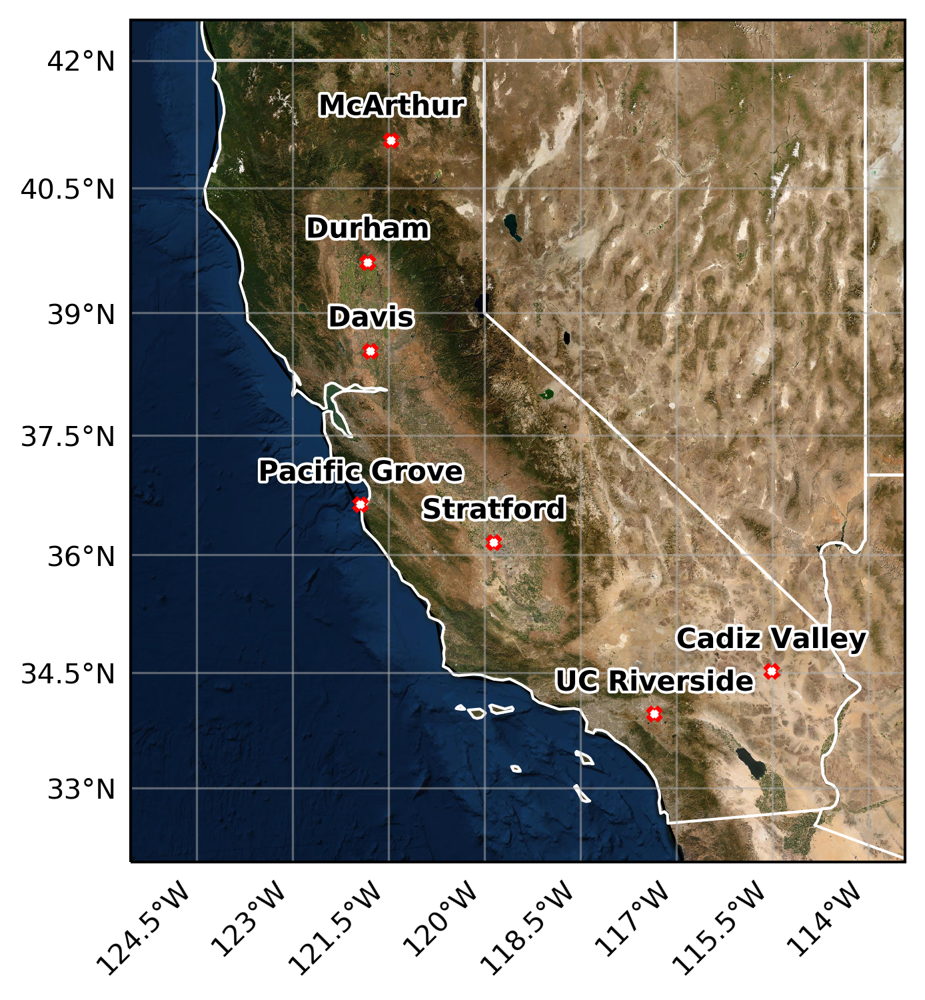

In [3]:
# Create map of stations
# NOTE: takes a while to run if zoom level is >6

# Class for grabbing high quality imagery tiles
class WorldImageryESRI(GoogleTiles):
    def _image_url(self, tile):
        x, y, z = tile
        url = ('https://server.arcgisonline.com/ArcGIS/rest/services/' \
               'World_Imagery/MapServer/tile/{z}/{y}/{x}.jpg').format(
               z=z, y=y, x=x)
        return url
    
white_outline = dict(path_effects=[PathEffects.withStroke(linewidth=2,foreground="w")])
white_plot = dict(path_effects=[PathEffects.Stroke(linewidth=5,foreground="w"), PathEffects.Normal()])

# Dictionary of station coordinates in [lon, lat]
station_coords = {'Cadiz Valley':[-115.51056, 34.513611],
                  'Davis': [-121.77636, 38.535694],
                  'Durham': [-121.82443, 39.608639],
                  'McArthur': [-121.45602, 41.063767], 
                  'Pacific Grove': [-121.93486, 36.633222], 
                  'Stratford': [-119.85143, 36.157972], 
                  'UC Riverside': [-117.33698, 33.964942]
                 }

cali_extent = [-113.419590, -125.535220, 32.025978, 42.470644] 

fig,ax = plt.subplots(subplot_kw={'projection':WorldImageryESRI().crs},**{'figsize':(5, 7),'dpi':300})

ax.set_extent(cali_extent)
ax.add_image(WorldImageryESRI(), 8) # Lower for coarse resolution, higher for hi


states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lakes',
    scale='50m',
    facecolor='none')

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(states_provinces, edgecolor='white')
    
for s in station_coords:
    lon = station_coords[s][0]
    lat = station_coords[s][1]
    ax.text(lon, lat+.3, s, ha='center', fontweight='bold', color='k',  transform = ccrs.PlateCarree(), **white_outline)
    ax.plot(lon, lat, ls='', marker='X', ms=5, color='red',  transform = ccrs.PlateCarree())
    ax.plot(lon, lat, ls='', marker='X', ms=2, color='white',  transform = ccrs.PlateCarree())

gl = ax.gridlines(ls='--', alpha=.5, draw_labels=True)
gl.xlabels_top = False
gl.ylabels_right = False
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlabel_style = {'rotation':45,'ha':'right'}

#scale_bar(ax, (.1,.1), 100, metres_per_unit=1000, unit_name='km', color='k',text_offset=.01,text_kwargs=white_outline, plot_kwargs=white_plot)
#ax.background_patch.set_visible(False)
#ax.outline_patch.set_visible(False)
plt.savefig('figures/study_area_stations.png',transparent=True, bbox_inches='tight', pad_inches=0)

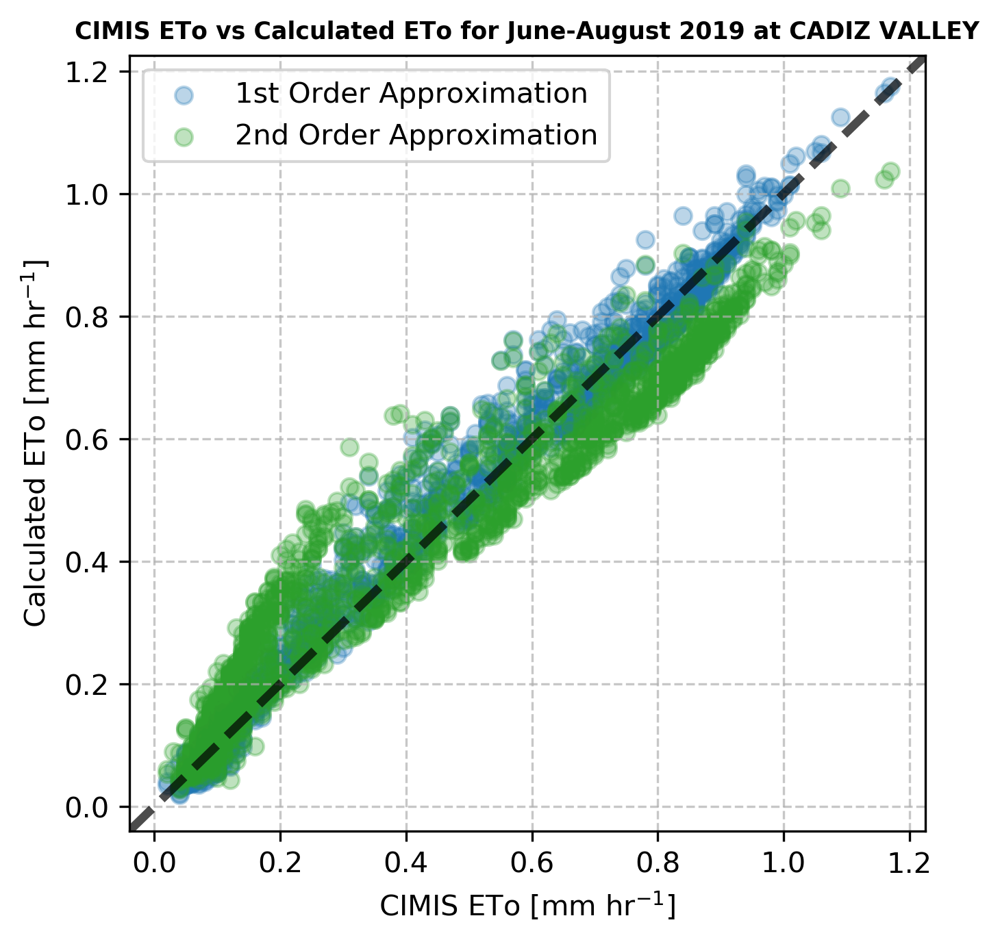

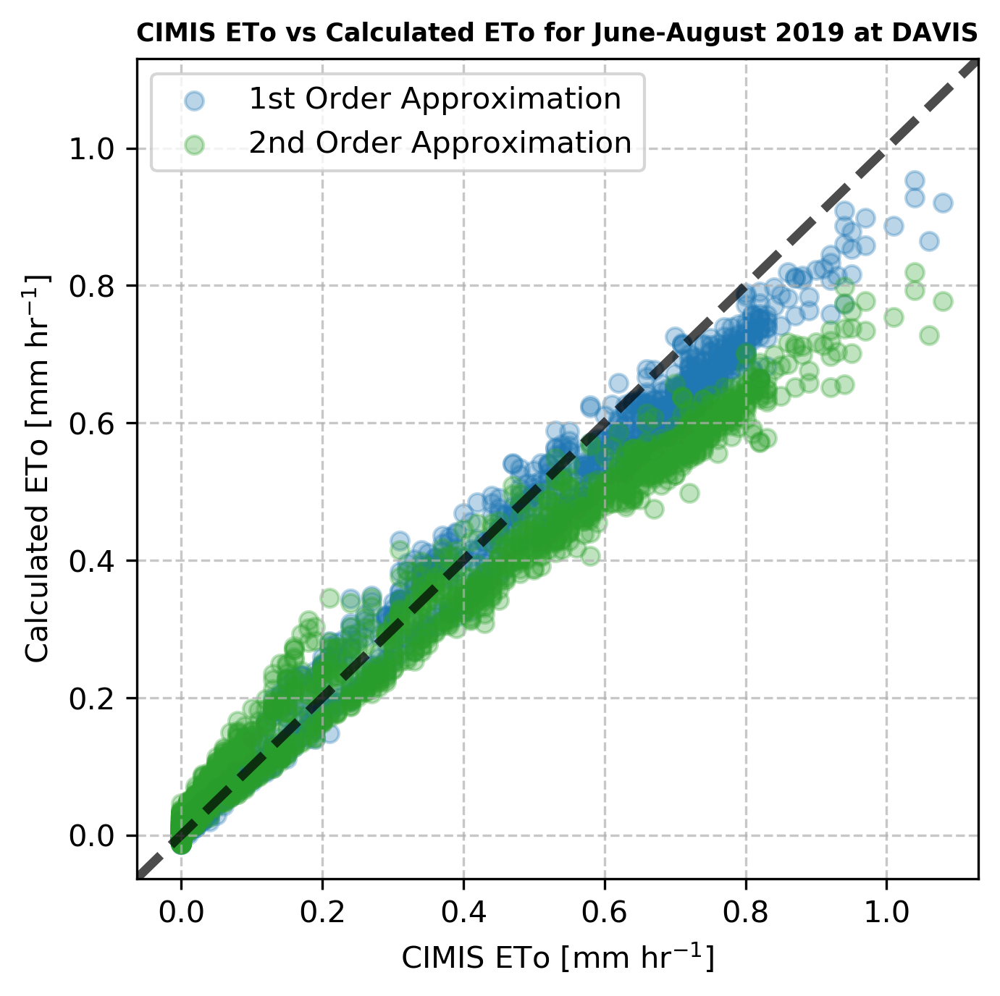

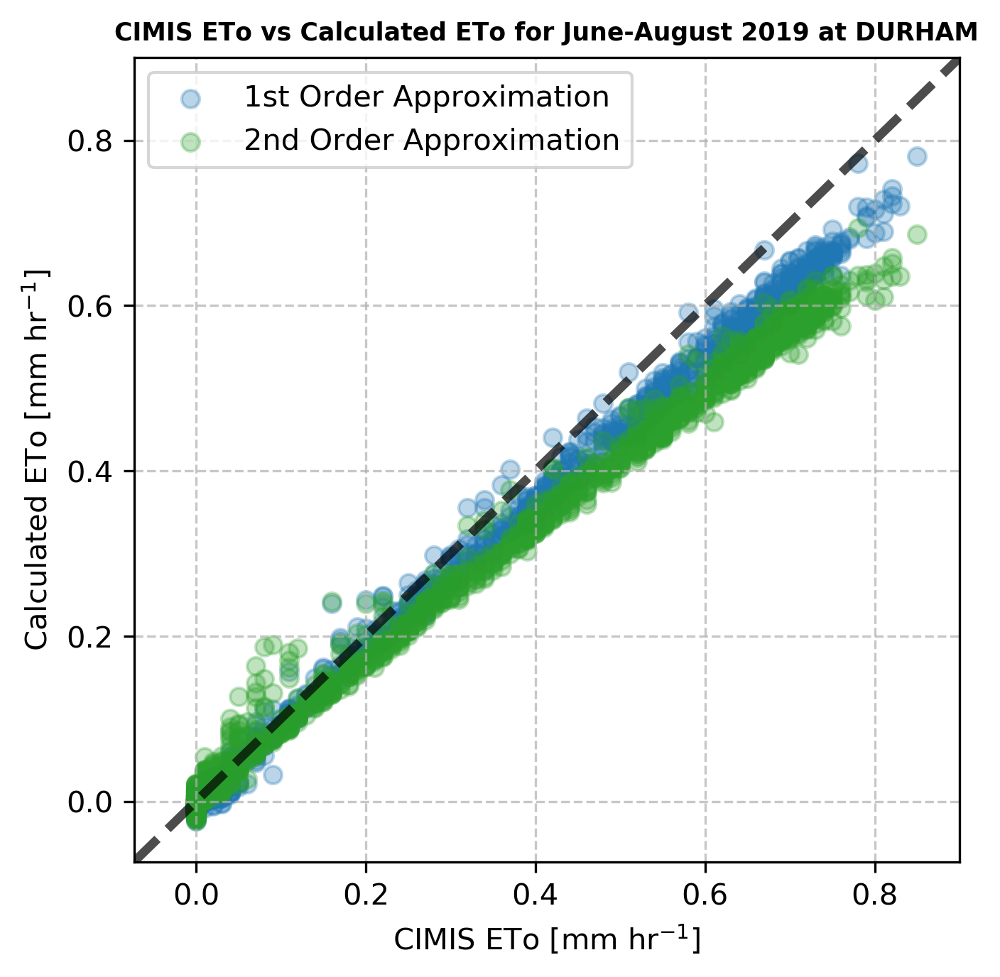

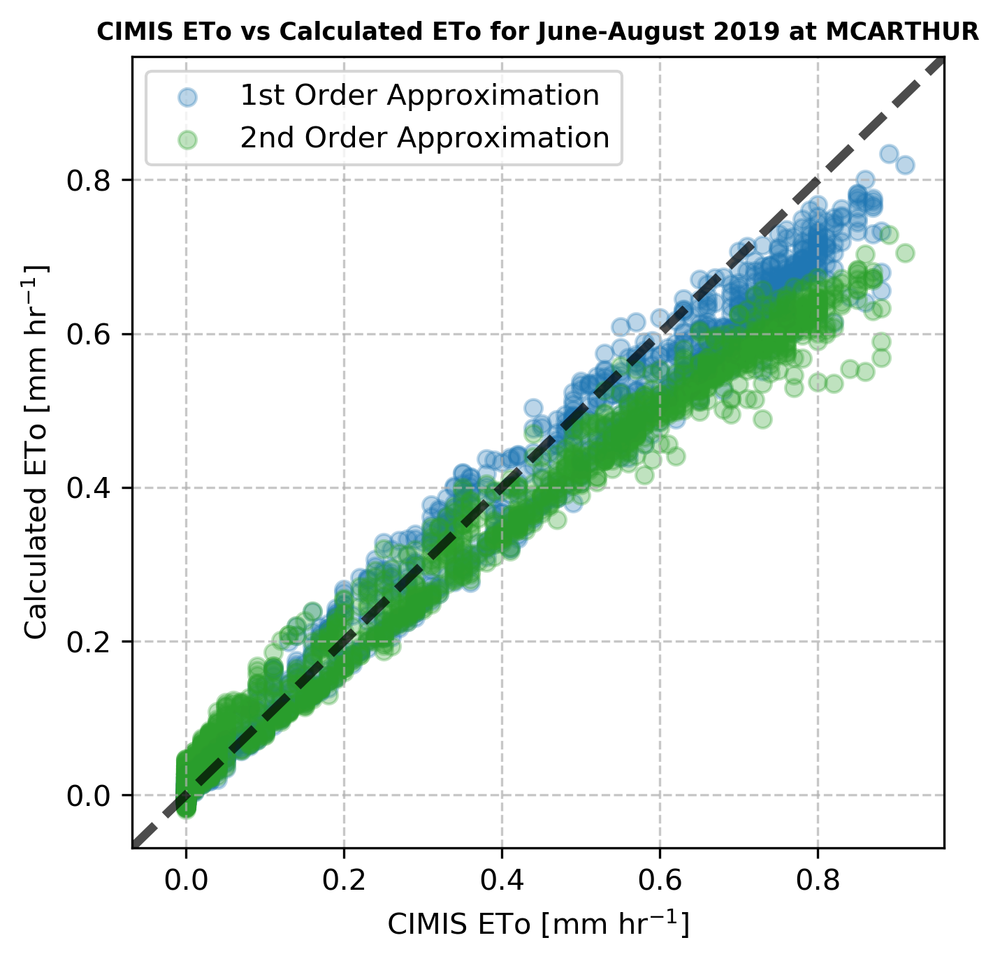

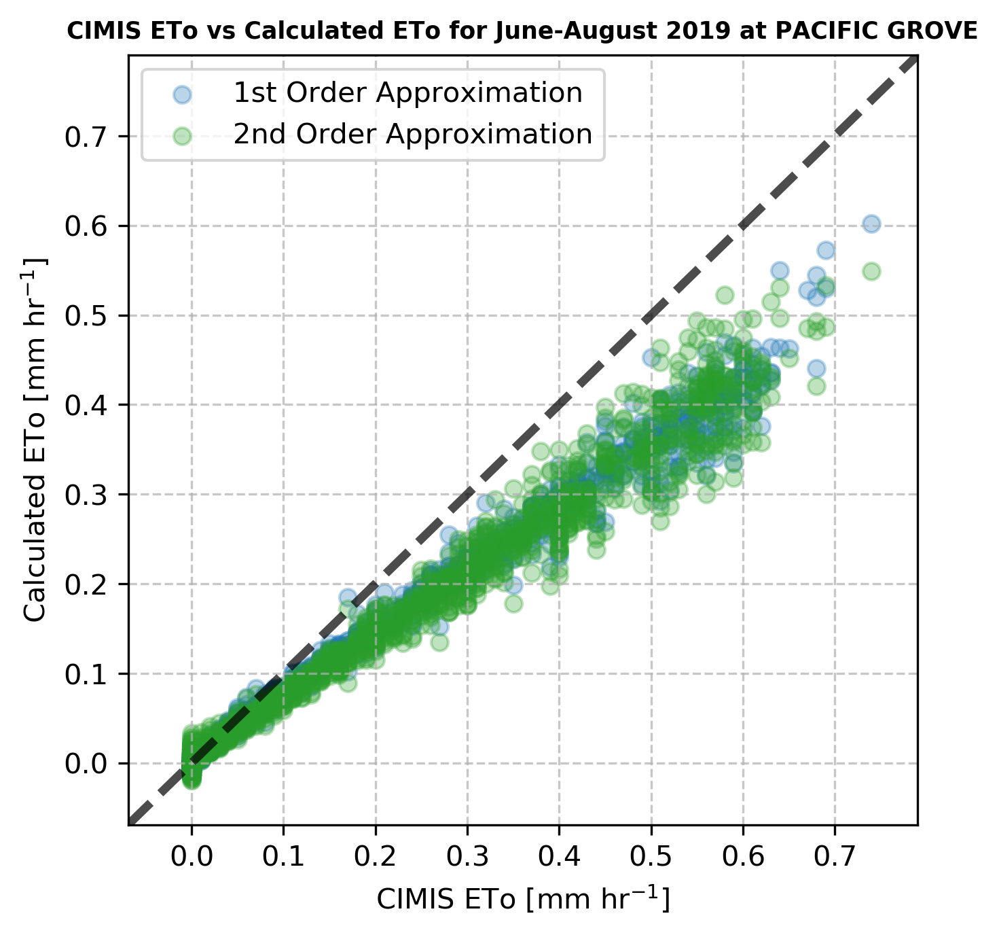

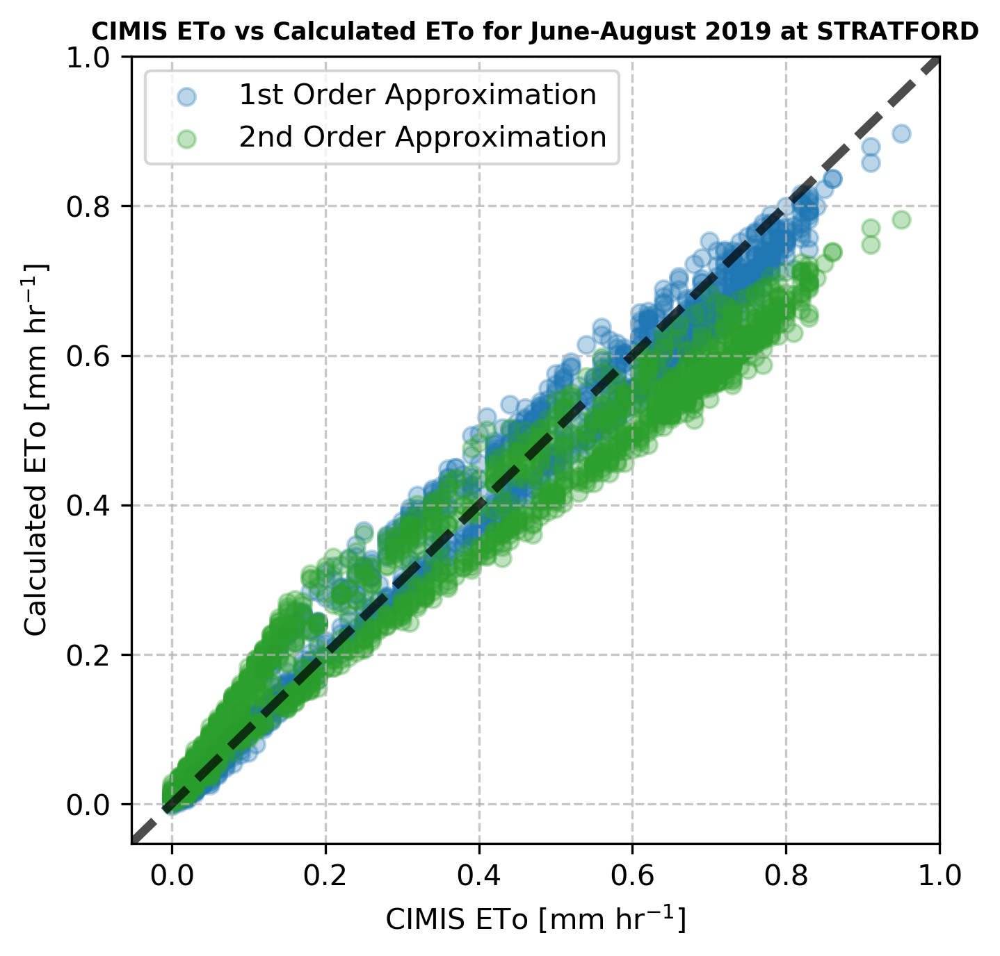

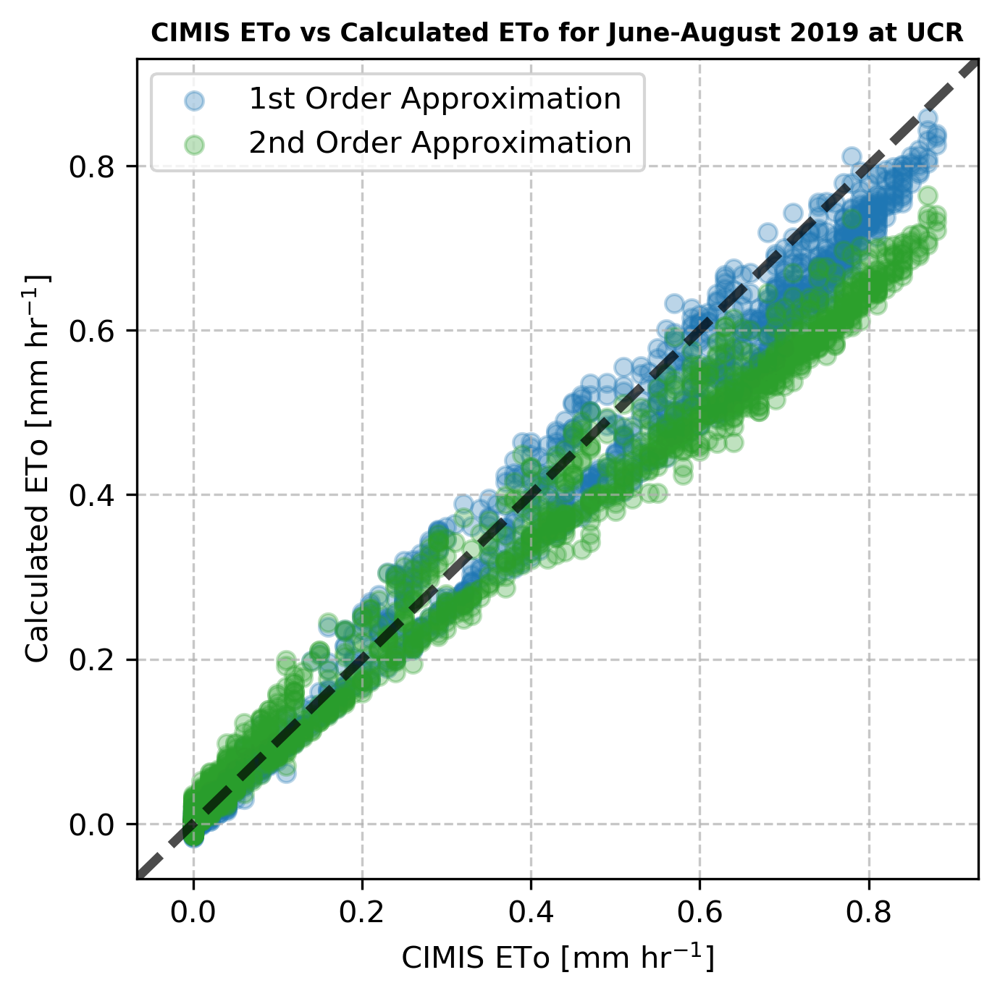

In [4]:
# ETo scatterplots for summer period
for s in stations:
    test_data = data_dict[s][slice('2019-06-01','2019-08-31')]
    lims = [np.nanmin(test_data[['ETo','ETo_1PM','ETo_2PM']].values)-.05,
            np.nanmax(test_data[['ETo','ETo_1PM','ETo_2PM']].values)+.05]
    
    # Plot ETo for cimis vs 1st and 2nd order approximations for test days
    fig, ax = plt.subplots(**{'figsize':(5, 5),'dpi':300})

    # Plot 1:1 line
    ax.plot(lims, lims, color='k', ls='--', lw=3, alpha=.7)

    # TODO: Calculate lines of best fit and r2 values (have code somewhere...)

    # Plot out scatterplots of CIMIS ETo vs. 1st and 2nd order approximation
    ax.scatter(test_data['ETo'], test_data['ETo_1PM'], color='C0', label='1st Order Approximation', alpha=.3)
    ax.scatter(test_data['ETo'], test_data['ETo_2PM'], color='C2', label='2nd Order Approximation', alpha=.3)
    
    # Plot formatting
    ax.set_xlim(*lims)
    ax.set_ylim(*lims)
    ax.set_xlabel(r'CIMIS ETo [mm hr$^{-1}$]')
    ax.set_ylabel(r'Calculated ETo [mm hr$^{-1}$]')
    ax.grid(ls='--', alpha=.7)
    ax.legend()
    ax.set_title(f"CIMIS ETo vs Calculated ETo for June-August 2019 at {s.upper().replace('_', ' ')}", fontweight='bold', fontsize='small')
    
    # Save figure
    os.makedirs(f'figures/eto_compare/summer19', exist_ok=True)
    fig.savefig(f'figures/eto_compare/summer19/{s}_summer19_eto_compare.png')#, transparent=True) # uncomment into call for transparent background

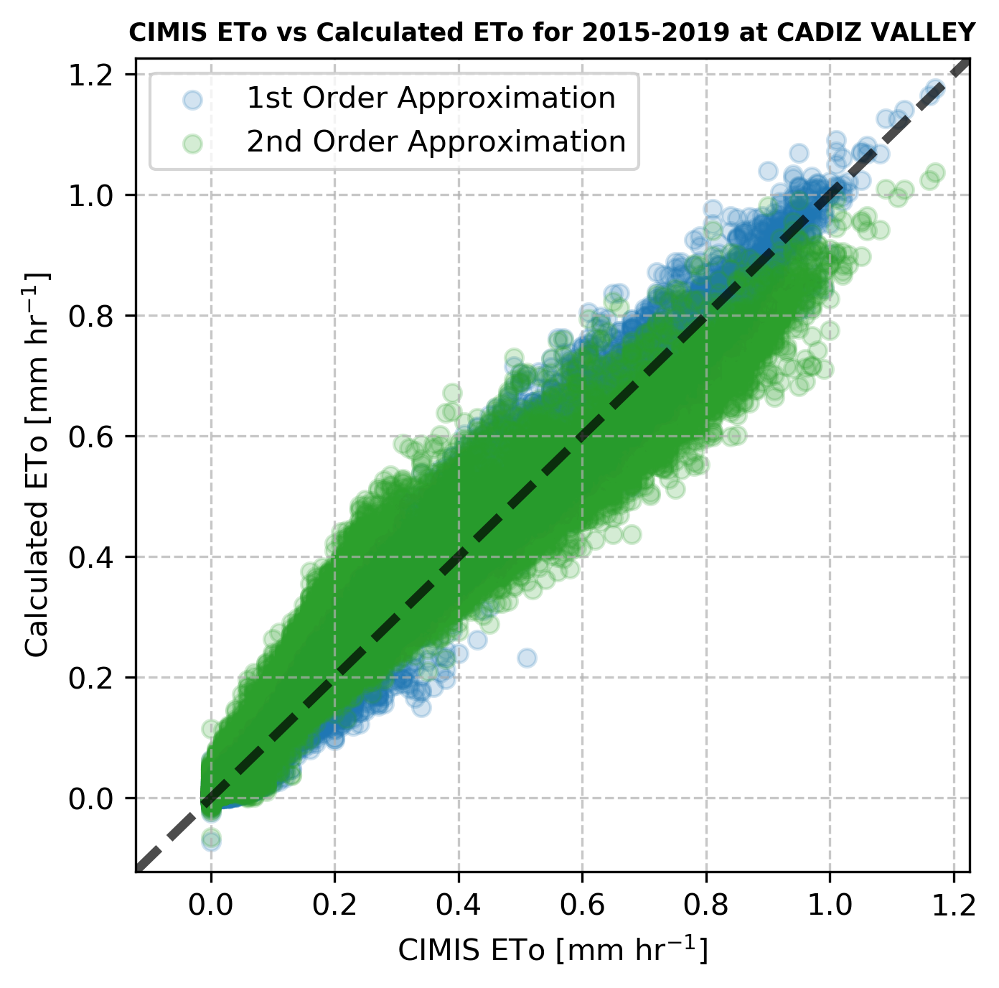

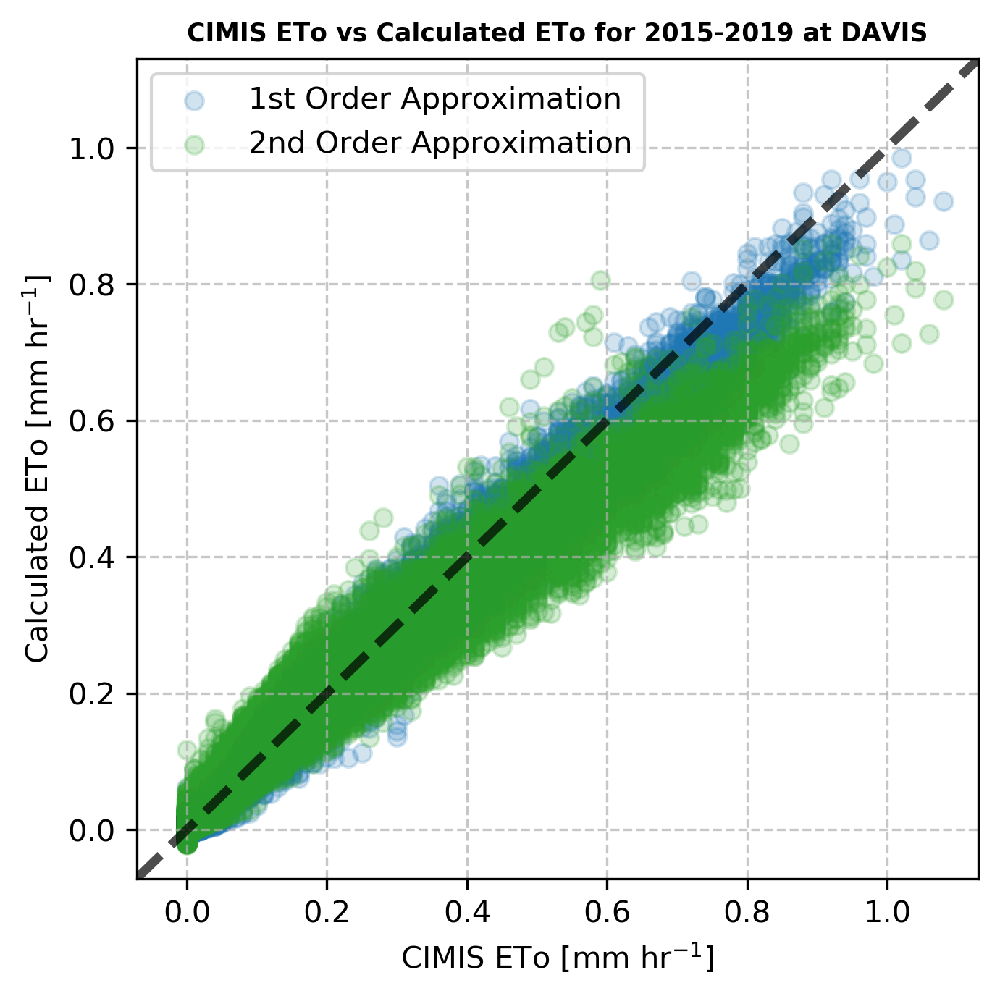

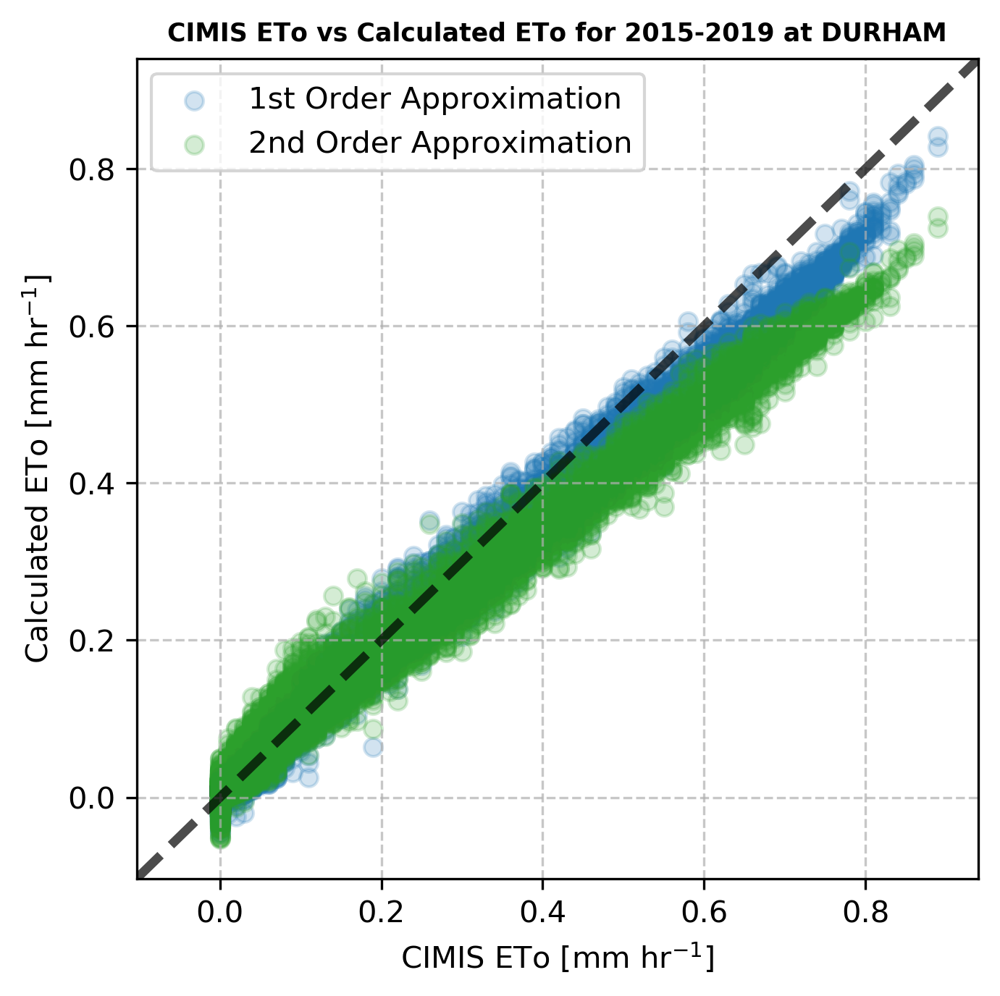

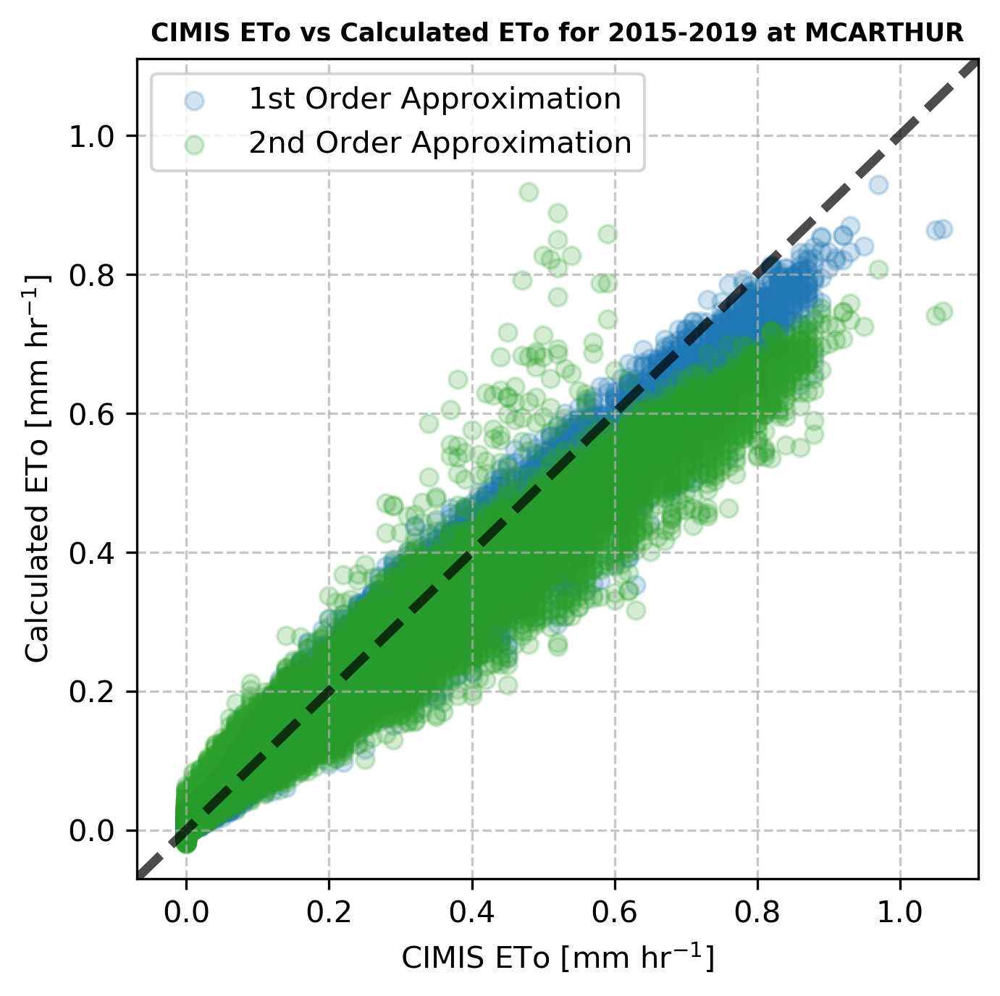

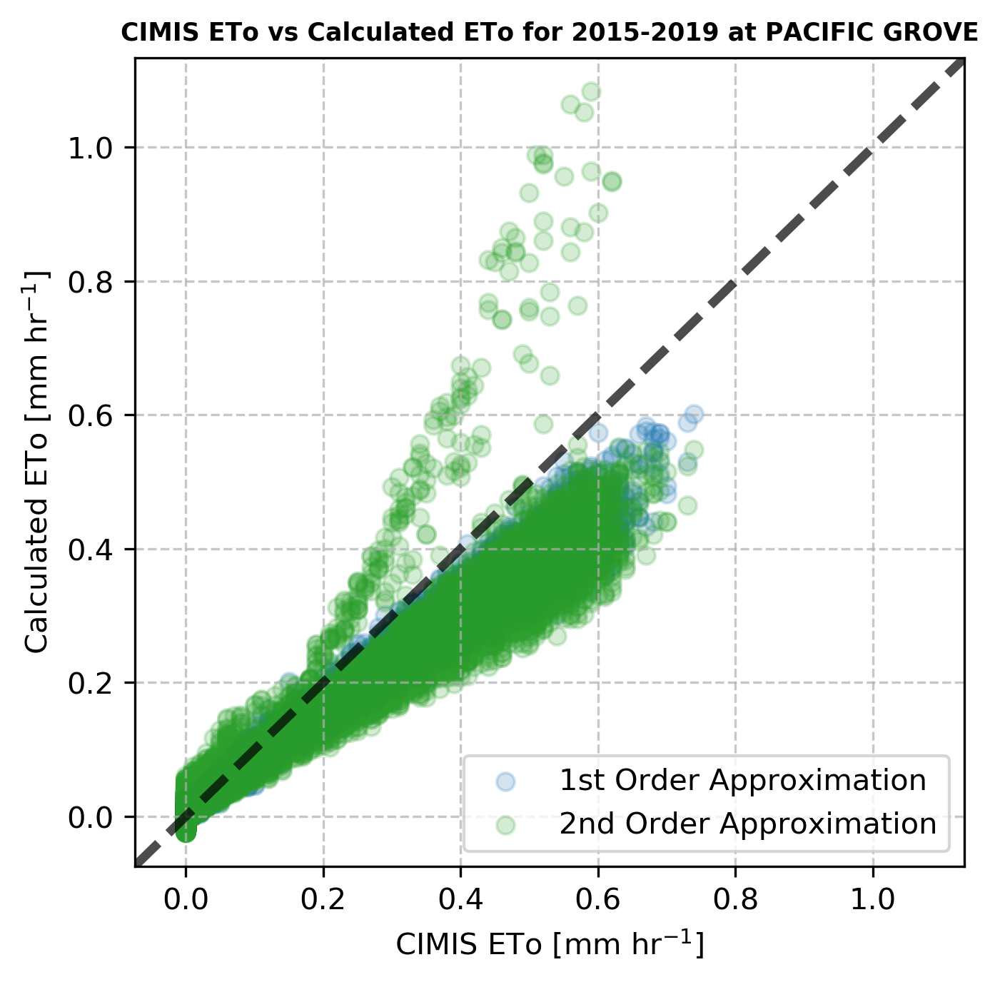

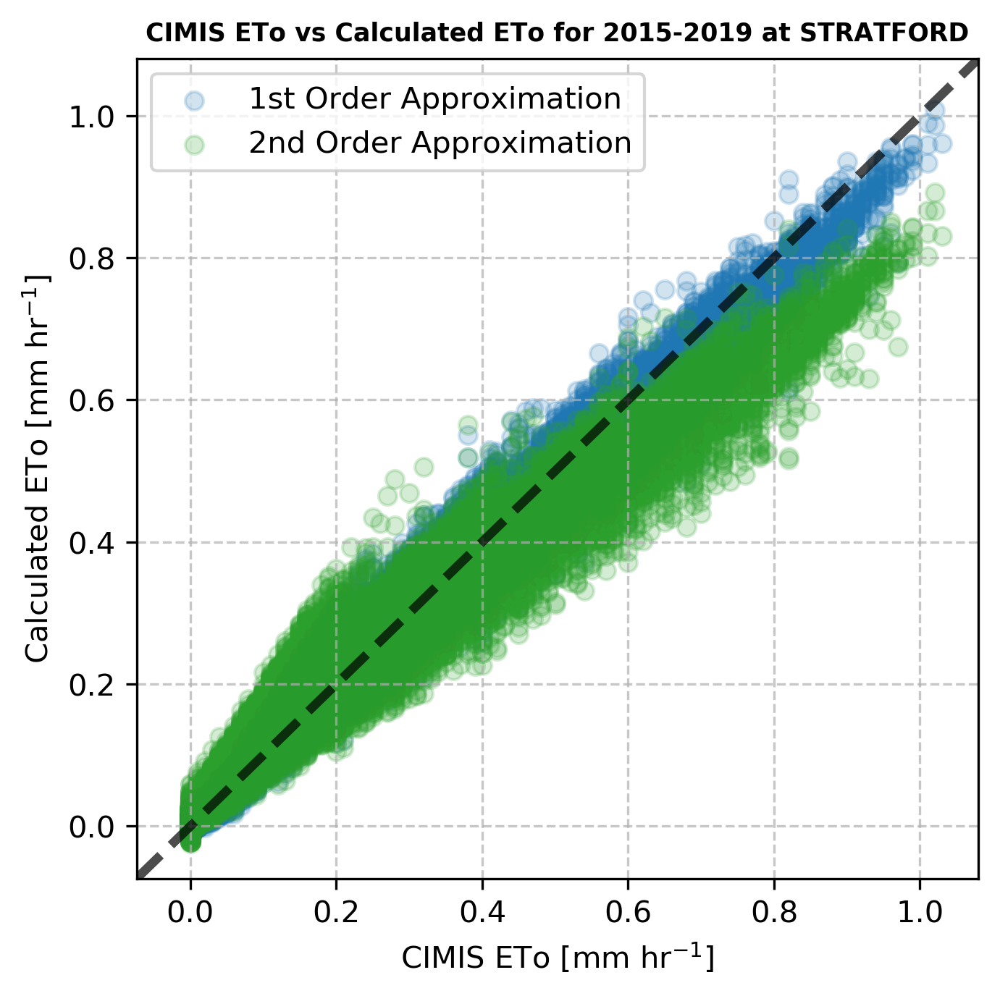

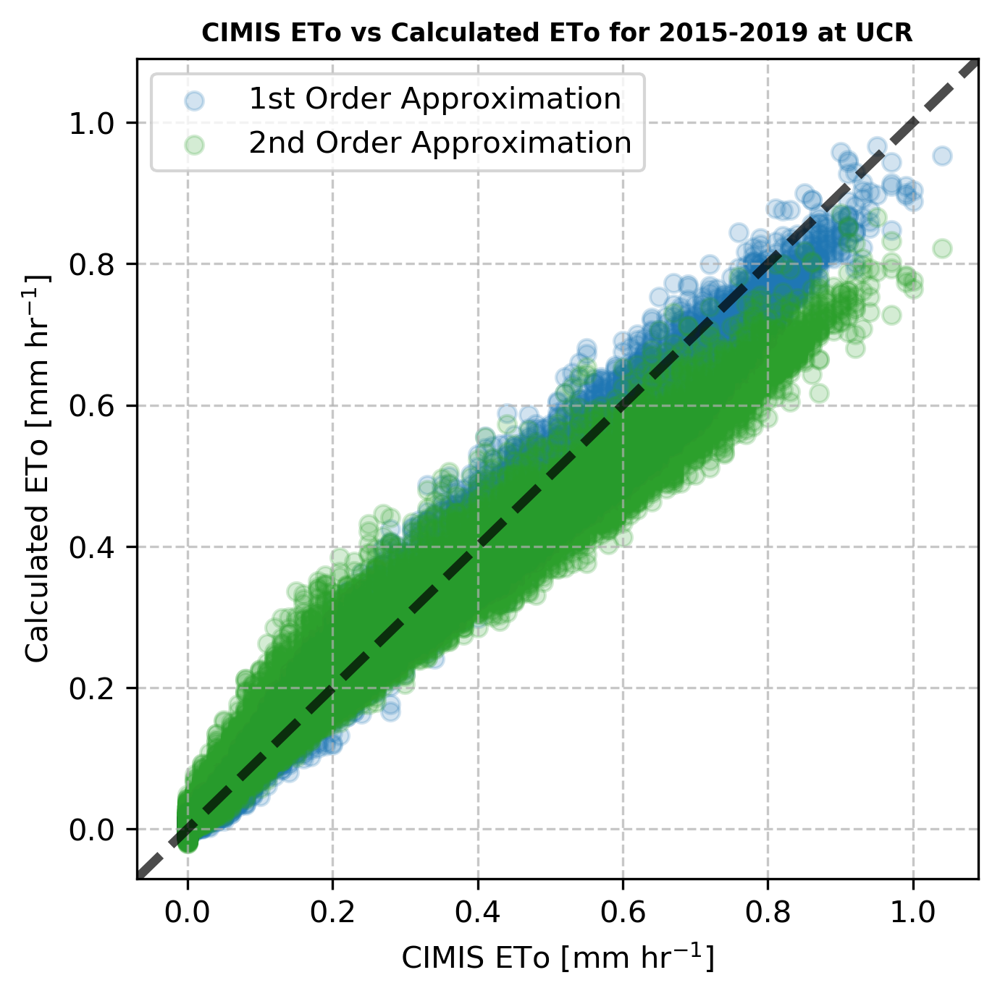

In [5]:
# ETo scatterplots for 2015-2019
for s in stations:
    test_data = data_dict[s]
    lims = [np.nanmin(test_data[['ETo','ETo_1PM','ETo_2PM']].values)-.05,
            np.nanmax(test_data[['ETo','ETo_1PM','ETo_2PM']].values)+.05]
    
    # Plot ETo for cimis vs 1st and 2nd order approximations for test days
    fig, ax = plt.subplots(**{'figsize':(5, 5),'dpi':300})

    # Plot 1:1 line
    ax.plot(lims, lims, color='k', ls='--', lw=3, alpha=.7)

    # TODO: Calculate lines of best fit and r2 values (have code somewhere...)

    # Plot out scatterplots of CIMIS ETo vs. 1st and 2nd order approximation
    ax.scatter(test_data['ETo'], test_data['ETo_1PM'], color='C0', label='1st Order Approximation', alpha=.2)
    ax.scatter(test_data['ETo'], test_data['ETo_2PM'], color='C2', label='2nd Order Approximation', alpha=.2)
    
    # Plot formatting
    ax.set_xlim(*lims)
    ax.set_ylim(*lims)
    ax.set_xlabel(r'CIMIS ETo [mm hr$^{-1}$]')
    ax.set_ylabel(r'Calculated ETo [mm hr$^{-1}$]')
    ax.grid(ls='--', alpha=.7)
    ax.legend()
    ax.set_title(f"CIMIS ETo vs Calculated ETo for 2015-2019 at {s.upper().replace('_', ' ')}", fontweight='bold', fontsize='small')
    
    # Save figure
    os.makedirs(f'figures/eto_compare/15_19', exist_ok=True)
    fig.savefig(f'figures/eto_compare/15_19/{s}_1519_eto_compare.png')#, transparent=True) # uncomment into call for transparent background